For Pleiades Aircraft Pleiades Dataset

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
fatal: destination path '/content/retinanet_custom' already exists and is not an empty directory.

📷 Image : 4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 10


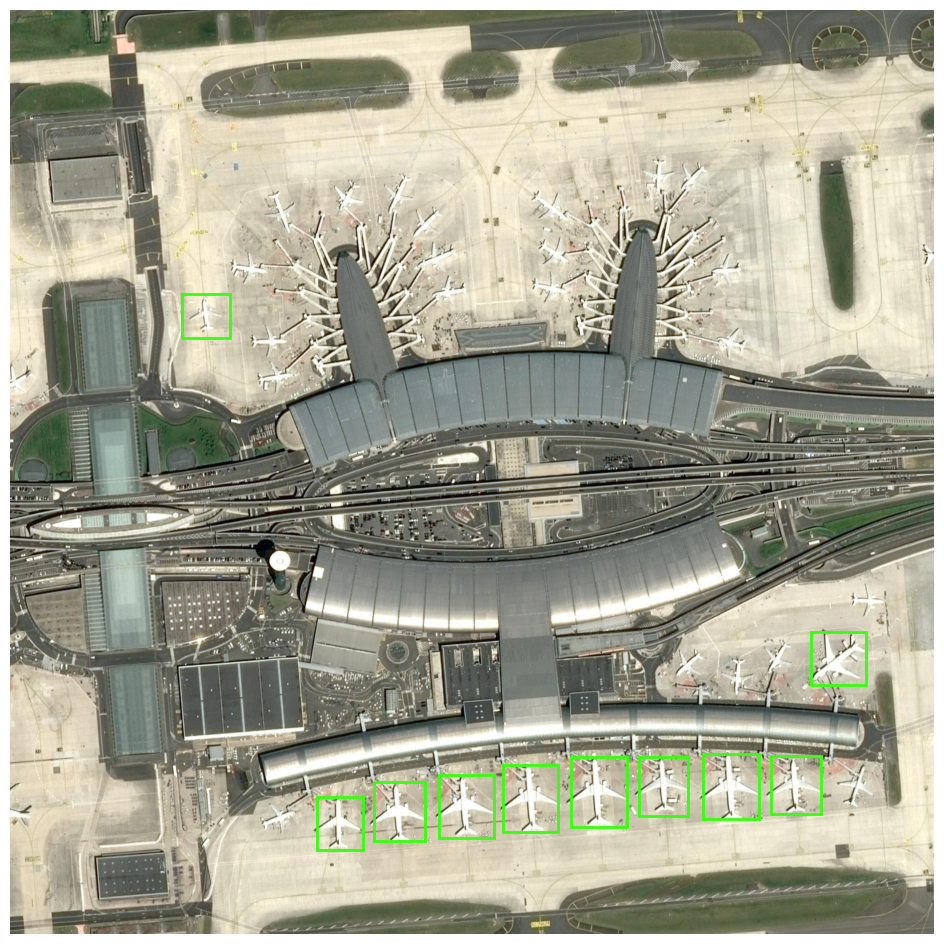

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_Optique/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_Optical_Predicted_Images_Annotated/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg

📷 Image : 576827bc-a94a-4611-8820-f3d56e969151.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 27


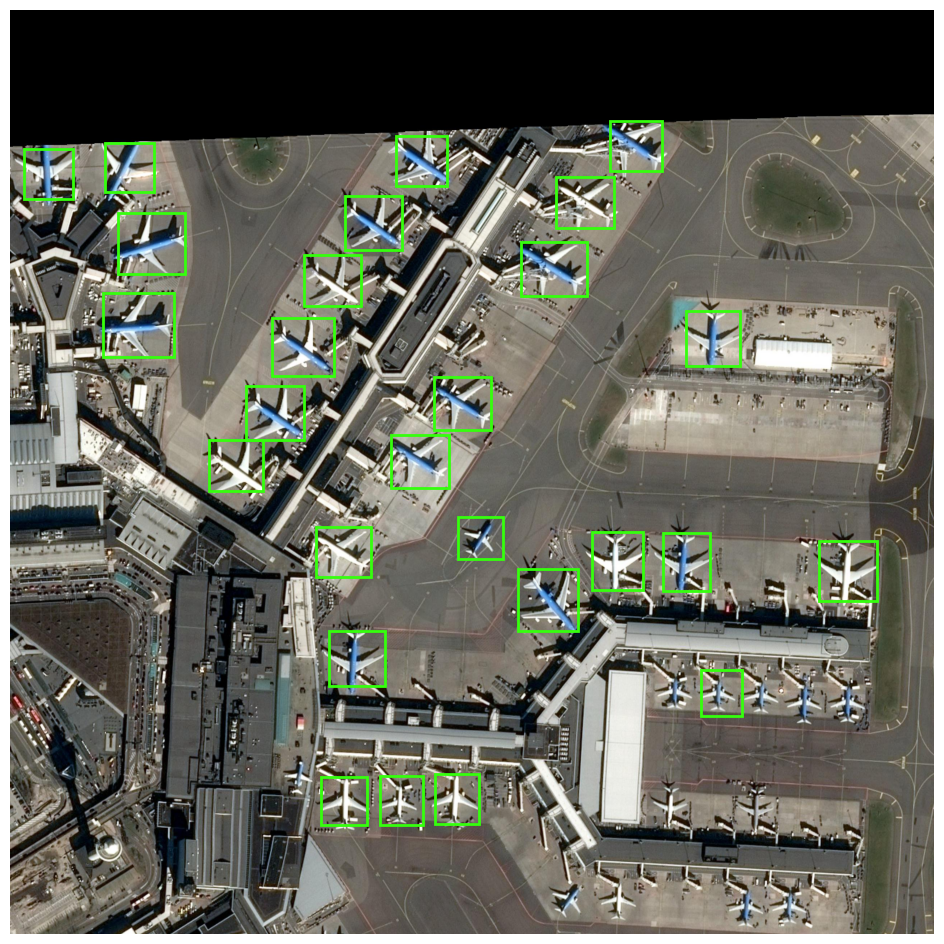

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_Optique/576827bc-a94a-4611-8820-f3d56e969151.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_Optical_Predicted_Images_Annotated/576827bc-a94a-4611-8820-f3d56e969151.jpg

📷 Image : dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 26


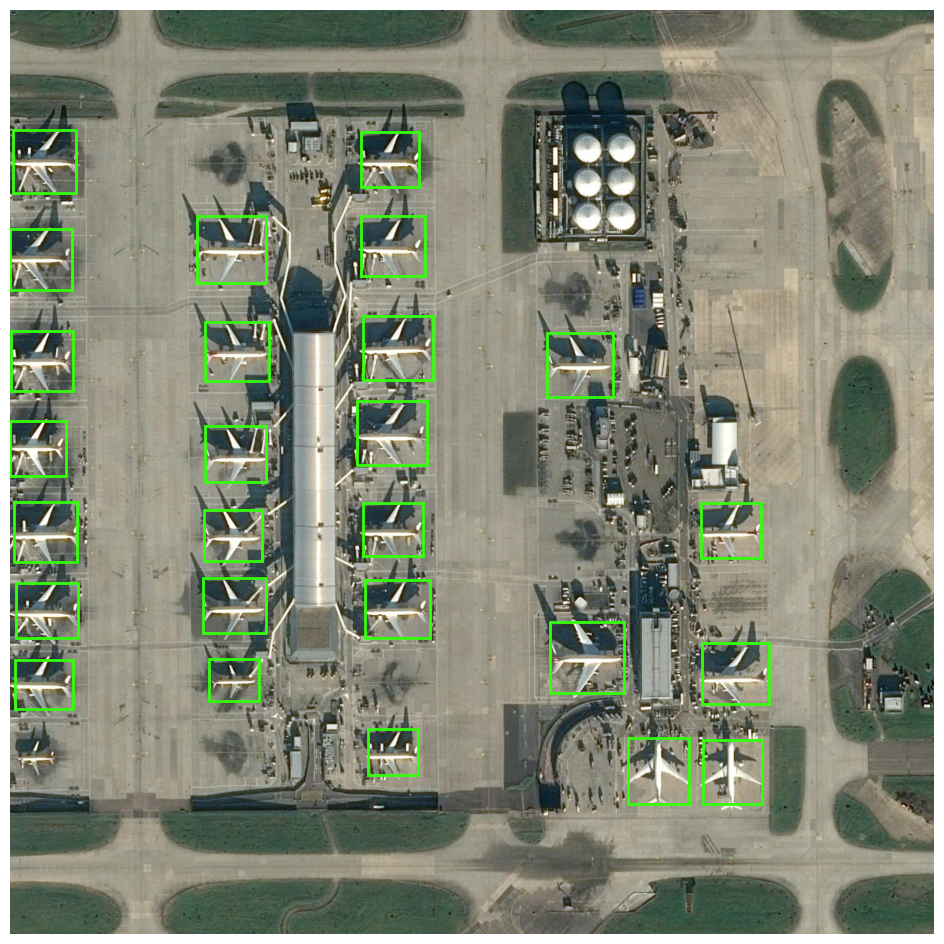

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_Optique/dacabde6-c8a7-475b-ab26-81b4e4dd5977.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_Optical_Predicted_Images_Annotated/dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg

📷 Image : f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 19


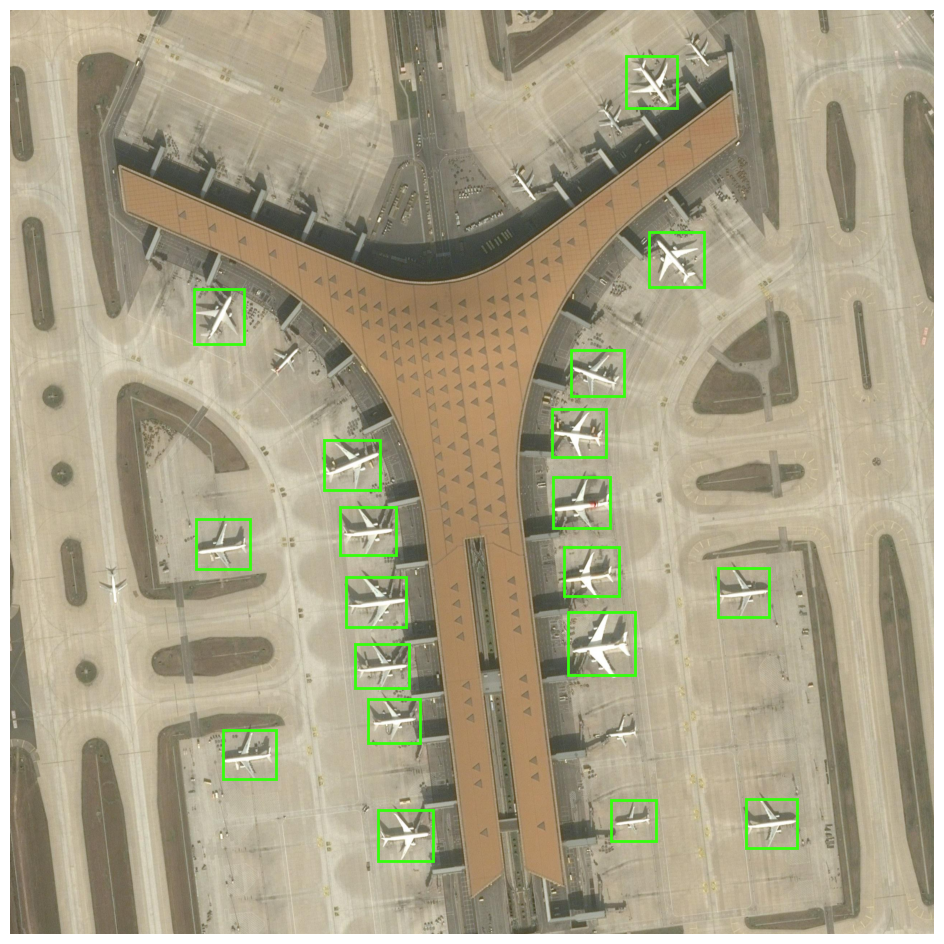

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_Optique/f82d64a6-3bfa-4612-bcbd-847a7d89c296.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_Optical_Predicted_Images_Annotated/f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg


In [2]:
# ✅ 1. Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Cloner le dépôt RetinaNet custom
!git clone https://github.com/yhenon/pytorch-retinanet.git /content/retinanet_custom

# ✅ 3. Ajouter le dépôt au PYTHONPATH
import sys
sys.path.append('/content/retinanet_custom')

# ✅ 4. Imports
import os, json, torch
import torchvision.transforms as T
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from retinanet import model as retinanet_model

# ✅ 5. Chemins
images_dir = "/content/drive/MyDrive/Predicted_Images/"
model_path = "/content/drive/MyDrive/Pretrained_Custom_Models/retinanet_Optical_model.pth"
json_output_dir = "/content/drive/MyDrive/JSONS_RETINANET_Optique/"
annotated_images_dir = "/content/drive/MyDrive/RETINANET_Optical_Predicted_Images_Annotated/"
os.makedirs(json_output_dir, exist_ok=True)
os.makedirs(annotated_images_dir, exist_ok=True)

# ✅ 6. Charger le modèle RetinaNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
retinanet = retinanet_model.resnet50(num_classes=2, pretrained=False)
state_dict = torch.load(model_path, map_location=device)
retinanet.load_state_dict(state_dict, strict=False)
retinanet = retinanet.to(device).eval()

# ✅ 7. Préparer les catégories
categories = [{"id": 1, "name": "Airplane"}]

# ✅ 8. Transformation avec redimensionnement + normalisation
transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

# ✅ 9. Prédictions image par image
image_files = sorted([f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
for image_name in image_files:
    image_path = os.path.join(images_dir, image_name)
    image = Image.open(image_path).convert("RGB")
    orig_w, orig_h = image.size
    image_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        scores, classifications, boxes = retinanet(image_tensor)

    scores = scores.cpu()
    classifications = classifications.cpu()
    boxes = boxes.cpu()

    print(f"\n📷 Image : {image_name}")
    print(f"🔢 Nombre total de prédictions (score ≥ 0.4) : ", end="")

    img_cv = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

    annotations = []
    boxes_to_display = []

    valid_count = 0
    for ann_id, (score, label, box) in enumerate(zip(scores, classifications, boxes)):
        if score < 0.4:
            continue
        valid_count += 1
        x_min, y_min, x_max, y_max = box.tolist()

        x_min = x_min * orig_w / 512
        x_max = x_max * orig_w / 512
        y_min = y_min * orig_h / 512
        y_max = y_max * orig_h / 512

        w = x_max - x_min
        h = y_max - y_min

        boxes_to_display.append((x_min, y_min, w, h, score))
        annotations.append({
            "id": ann_id,
            "image_id": 0,
            "category_id": 1,
            "bbox": [x_min, y_min, w, h],
            "area": w * h,
            "iscrowd": 0,
            "score": float(score)
        })

    print(f"{valid_count}")

    # ✅ Affichage et sauvegarde de l'image annotée sans axes
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img_rgb)
    for (x, y, w, h, score) in boxes_to_display:
        rect = Rectangle((x, y), w, h, edgecolor='#35ff0d', linewidth=2, facecolor='none')
        ax.add_patch(rect)
    ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # 💾 Sauvegarde image annotée
    annotated_path = os.path.join(annotated_images_dir, image_name)
    fig.savefig(annotated_path, bbox_inches='tight', pad_inches=0)

    # 👁️ Affichage dans la console
    plt.show()
    plt.close(fig)

    # ✅ Export COCO JSON
    coco_dict = {
        "images": [{
            "id": 0,
            "file_name": image_name,
            "width": orig_w,
            "height": orig_h
        }],
        "annotations": annotations,
        "categories": categories
    }

    json_filename = os.path.splitext(image_name)[0] + ".json"
    json_path = os.path.join(json_output_dir, json_filename)
    with open(json_path, 'w') as f:
        json.dump(coco_dict, f, indent=2)

    print(f"💾 JSON exporté : {json_path}")
    print(f"🖼️ Image annotée sauvegardée : {annotated_path}")

For SSDD:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
fatal: destination path '/content/retinanet_custom' already exists and is not an empty directory.

📷 Image : 000207.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 4


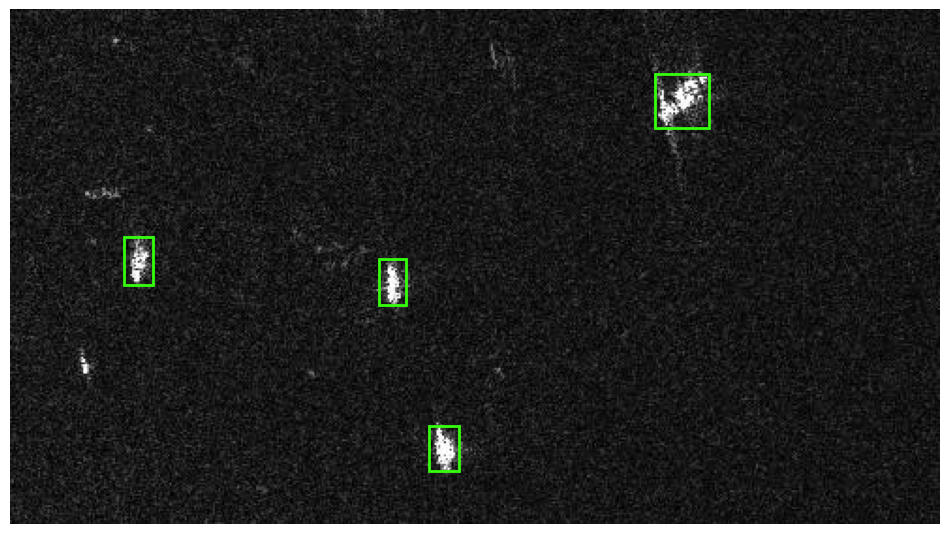

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_SAR/000207.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/000207.jpg

📷 Image : 000219.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 4


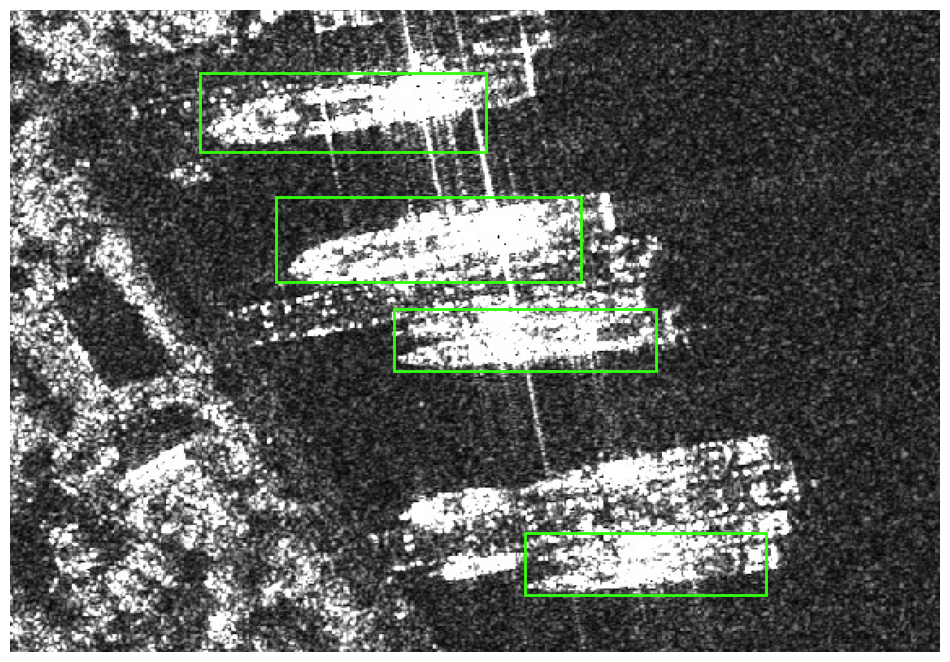

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_SAR/000219.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/000219.jpg

📷 Image : 000223.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 1


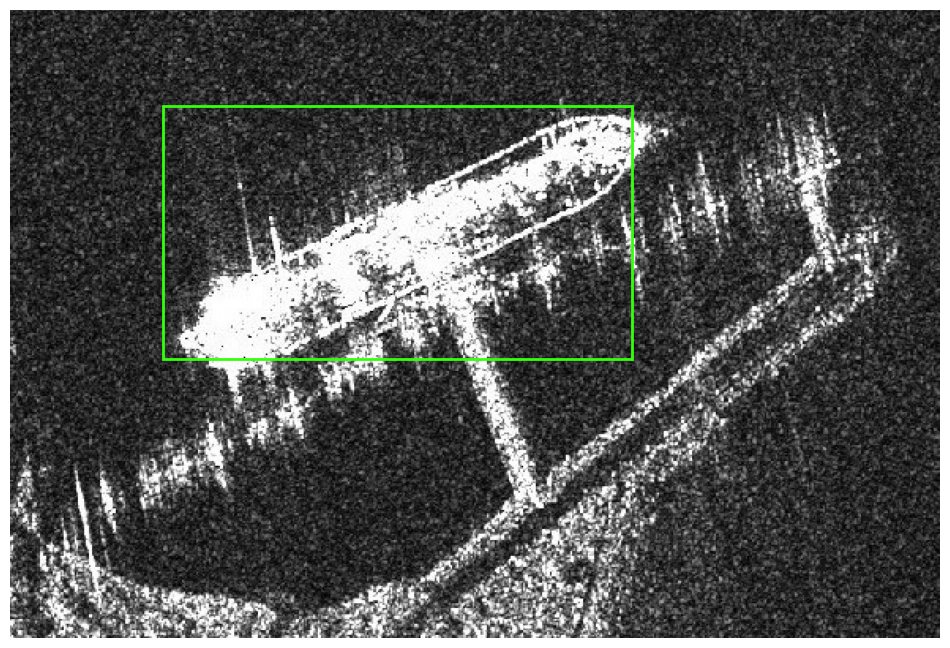

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_SAR/000223.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/000223.jpg

📷 Image : 000228.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 1


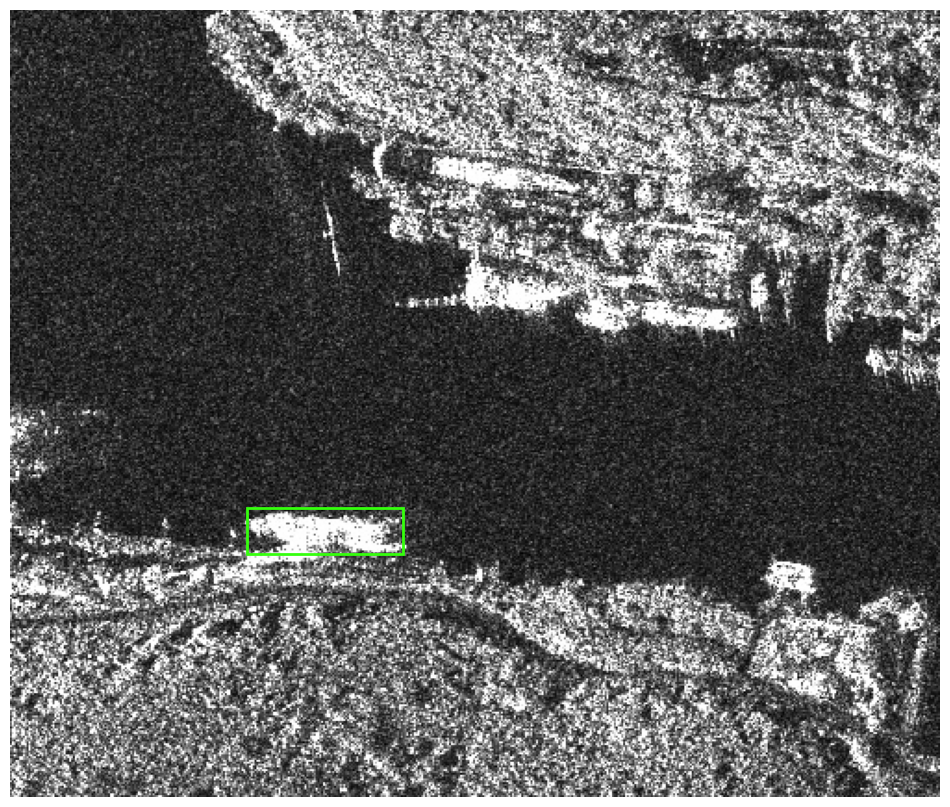

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_SAR/000228.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/000228.jpg

📷 Image : 000229.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 4


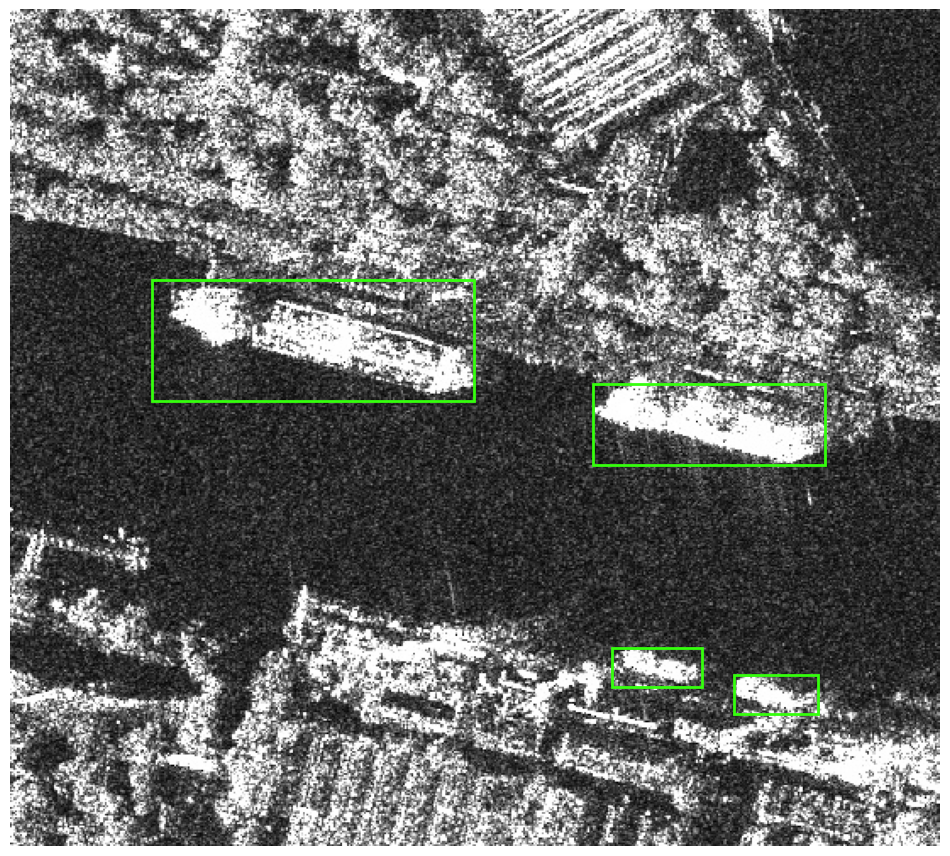

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_SAR/000229.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/000229.jpg

📷 Image : 000233.jpg
🔢 Nombre total de prédictions (score ≥ 0.4) : 2


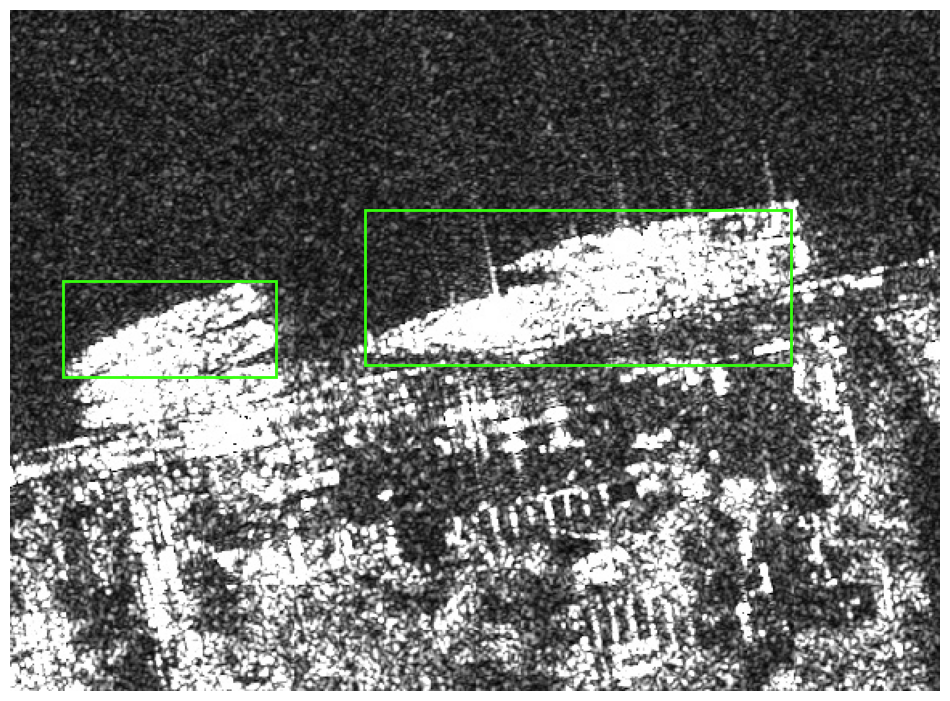

💾 JSON exporté : /content/drive/MyDrive/JSONS_RETINANET_SAR/000233.json
🖼️ Image annotée sauvegardée : /content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/000233.jpg


In [3]:
# ✅ 1. Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Cloner le dépôt RetinaNet custom
!git clone https://github.com/yhenon/pytorch-retinanet.git /content/retinanet_custom

# ✅ 3. Ajouter le dépôt au PYTHONPATH
import sys
sys.path.append('/content/retinanet_custom')

# ✅ 4. Imports
import os, json, torch
import torchvision.transforms as T
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from retinanet import model as retinanet_model

# ✅ 5. Chemins
images_dir = "/content/drive/MyDrive/Predicted_SAR_Images/"
model_path = "/content/drive/MyDrive/Pretrained_Custom_Models/retinanet_SAR_model.pth"
json_output_dir = "/content/drive/MyDrive/JSONS_RETINANET_SAR/"
annotated_images_dir = "/content/drive/MyDrive/RETINANET_SAR_Predicted_Images_Annotated/"
os.makedirs(json_output_dir, exist_ok=True)
os.makedirs(annotated_images_dir, exist_ok=True)

# ✅ 6. Charger le modèle RetinaNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
retinanet = retinanet_model.resnet50(num_classes=2, pretrained=False)
state_dict = torch.load(model_path, map_location=device)
retinanet.load_state_dict(state_dict, strict=False)
retinanet = retinanet.to(device).eval()

# ✅ 7. Préparer les catégories
categories = [{"id": 1, "name": "Ship"}]

# ✅ 8. Transformation avec redimensionnement + normalisation
transform = T.Compose([
    T.Resize((512, 512)),  # Même taille que pendant l'entraînement
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

# ✅ 9. Prédictions image par image
image_files = sorted([f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
for image_name in image_files:
    image_path = os.path.join(images_dir, image_name)
    image = Image.open(image_path).convert("RGB")
    orig_w, orig_h = image.size
    image_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        scores, classifications, boxes = retinanet(image_tensor)

    scores = scores.cpu()
    classifications = classifications.cpu()
    boxes = boxes.cpu()

    print(f"\n📷 Image : {image_name}")
    print(f"🔢 Nombre total de prédictions (score ≥ 0.4) : ", end="")

    img_cv = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

    annotations = []
    boxes_to_display = []

    valid_count = 0
    for ann_id, (score, label, box) in enumerate(zip(scores, classifications, boxes)):
        if score < 0.4:
            continue
        valid_count += 1
        x_min, y_min, x_max, y_max = box.tolist()

        x_min = x_min * orig_w / 512
        x_max = x_max * orig_w / 512
        y_min = y_min * orig_h / 512
        y_max = y_max * orig_h / 512

        w = x_max - x_min
        h = y_max - y_min

        boxes_to_display.append((x_min, y_min, w, h, score))
        annotations.append({
            "id": ann_id,
            "image_id": 0,
            "category_id": 1,
            "bbox": [x_min, y_min, w, h],
            "area": w * h,
            "iscrowd": 0,
            "score": float(score)
        })

    print(f"{valid_count}")

    # ✅ Affichage + sauvegarde sans axes ni labels
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img_rgb)
    for (x, y, w, h, score) in boxes_to_display:
        rect = Rectangle((x, y), w, h, edgecolor='#35ff0d', linewidth=2, facecolor='none')
        ax.add_patch(rect)
    ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # 💾 Sauvegarde image annotée
    annotated_path = os.path.join(annotated_images_dir, image_name)
    fig.savefig(annotated_path, bbox_inches='tight', pad_inches=0)

    # 👁️ Affichage dans la console Colab
    plt.show()
    plt.close(fig)

    # ✅ Export COCO JSON
    coco_dict = {
        "images": [{
            "id": 0,
            "file_name": image_name,
            "width": orig_w,
            "height": orig_h
        }],
        "annotations": annotations,
        "categories": categories
    }

    json_filename = os.path.splitext(image_name)[0] + ".json"
    json_path = os.path.join(json_output_dir, json_filename)
    with open(json_path, 'w') as f:
        json.dump(coco_dict, f, indent=2)

    print(f"💾 JSON exporté : {json_path}")
    print(f"🖼️ Image annotée sauvegardée : {annotated_path}")